In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
from typing import List, Dict, Optional, Union
import numpy as np
import torch

import sys 
sys.path.append(".")
sys.path.append("..")

from pipeline_attend_and_excite import AttendAndExcitePipeline
from config import RunConfig
from run import run_on_prompt, get_indices_to_alter
from utils import vis_utils
from utils.ptp_utils import AttentionStore

%load_ext autoreload 
%autoreload 2

In [3]:
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
seed = 21
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
#tokenizer = stable.tokenizer

## CalcAttentionPipeline

HACK: modified pipeline_stable_diffusion.py's __call__, to only run the final iteration, and avoid injecting large noise:

In [4]:
from pipeline_stable_diffusion import StableDiffusionPipeline
from diffusers.schedulers import LMSDiscreteScheduler
class CalcAttentionPipeline(StableDiffusionPipeline):
    @torch.no_grad()
    def __call__(
            self,
            prompt: Union[str, List[str]],
            height: Optional[int] = 512,
            width: Optional[int] = 512,
            num_inference_steps: Optional[int] = 50,
            guidance_scale: Optional[float] = 7.5,
            eta: Optional[float] = 0.0,
            generator: Optional[torch.Generator] = None,
            latents: Optional[torch.FloatTensor] = None,
            output_type: Optional[str] = "pil",
            return_dict: bool = True,
            **kwargs):

        text_embeddings, text_input, latents, do_classifier_free_guidance, extra_step_kwargs = self._setup_inference(
            prompt=prompt,
            height=height,
            width=width,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            eta=eta,
            generator=generator,
            latents=latents, **kwargs
        )

        # claforte: only run the final step, to avoid injecting noise, but still evaluate cross-attention.
        t = 1
        i = 50
        #for i, t in enumerate(self.progress_bar(self.scheduler.timesteps[-2:])):

        # expand the latents if we are doing classifier free guidance
        latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
        if isinstance(self.scheduler, LMSDiscreteScheduler):
            sigma = self.scheduler.sigmas[i]
            # the model input needs to be scaled to match the continuous ODE formulation in K-LMS
            latent_model_input = latent_model_input / ((sigma ** 2 + 1) ** 0.5)

        # predict the noise residual
        noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        if do_classifier_free_guidance:
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        if isinstance(self.scheduler, LMSDiscreteScheduler):
            latents = self.scheduler.step(noise_pred, i, latents, **extra_step_kwargs).prev_sample
        else:
            latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs).prev_sample

        outputs = self._prepare_output(latents, output_type, return_dict)
        return outputs

# Load Model Weights (may take a few minutes)

In [5]:
attention_stable = CalcAttentionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4").to(device)

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

# Pipeline Wrapper

In [6]:
# configurable parameters (see RunConfig for all parameters)
# scale factor - intensity of shift by gradient
# thresholds - a dictionary for iterative refinement mapping the iteration number to the attention threshold
# max_iter_to_alter- maximal inference timestep to apply Attend-and-Excite
def run_and_display(model,
                    prompts: List[str],
                    controller: AttentionStore,
                    indices_to_alter: List[int],
                    generator: torch.Generator,
                    run_standard_sd: bool = False,
                    scale_factor: int = 20,
                    thresholds: Dict[int, float] = {10: 0.5, 20: 0.8},
                    max_iter_to_alter: int = 25,
                    display_output: bool = False,
                    latents: Optional[torch.FloatTensor] = None,
                    **kwargs):
    config = RunConfig(prompt=prompts[0],
                       run_standard_sd=run_standard_sd,
                       scale_factor=scale_factor,
                       thresholds=thresholds,
                       max_iter_to_alter=max_iter_to_alter)
    image = run_on_prompt(model=model,
                          prompt=prompts,
                          controller=controller,
                          token_indices=indices_to_alter,
                          seed=generator,
                          config=config,
                          latents=latents, **kwargs)
    if display_output:
        display(image)
    return image

## Convert image <-> latents

In [7]:
import PIL

In [33]:
import os
os.getcwd()

'/home/claforte/git/Attend-and-Excite/notebooks'

In [35]:
image_path = "../docs/453148839_A_photo_centered_on_a_happy_beagle_puppy_riding_a_skateboard.png"
image = PIL.Image.open(image_path)
#image

In [9]:
# Adapted from https://towardsdatascience.com/stable-diffusion-using-hugging-face-501d8dbdd8

## To import an image from a URL 
from fastdownload import FastDownload  # `pip install fastdownload`, if needed
## Imaging  library 
from PIL import Image 
from torchvision import transforms as tfms  
## Basic libraries 
import numpy as np 
import matplotlib.pyplot as plt 
%matplotlib inline  
## Loading a VAE model 
from diffusers import AutoencoderKL 

# vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", torch_dtype=torch.float16).to("cuda")
vae = attention_stable.vae

def pil_to_latents(image):
    '''     
    Function to convert image to latents     
    '''     
    init_image = tfms.ToTensor()(image).unsqueeze(0) * 2.0 - 1.0   
    init_image = init_image.to(device="cuda", dtype=torch.float32)
    init_latent_dist = vae.encode(init_image).latent_dist.sample() * 0.18215     
    return init_latent_dist  
def latents_to_pil(latents):     
    '''     
    Function to convert latents to images     
    '''     
    latents = (1 / 0.18215) * latents     
    with torch.no_grad():         
        image = vae.decode(latents).sample     
    
    image = (image / 2 + 0.5).clamp(0, 1)     
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()      
    images = (image * 255).round().astype("uint8")     
    pil_images = [Image.fromarray(image) for image in images]        
    return pil_images

In [36]:
latents = pil_to_latents(PIL.Image.open(image_path))

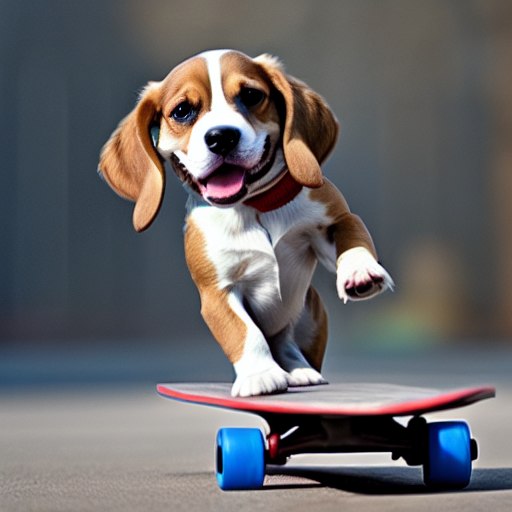

In [11]:
ae_image = latents_to_pil(latents)[0]
ae_image

## `show_cross_attention_for_img`

In [12]:
def show_cross_attention_for_img(prompts,
                        token_indices=None,
                        latents=latents,
                        res=16,
                        from_where=("up", "down", "mid"),
                        vis_image_size=256,
                        auto_scale_heatmap=True,
                        heatmap_scale=100.0):
    controller = AttentionStore()
    g = torch.Generator('cuda').manual_seed(seed)
    run_standard_sd=False
    if token_indices is None:
        #token_indices = get_indices_to_alter(attention_stable, prompts)
        token_indices = list(range(0,len(prompts.split()) + 1))

    image = run_and_display(attention_stable,
                        prompts=prompts,
                        controller=controller,
                        indices_to_alter=token_indices,
                        generator=g,
                        run_standard_sd=False,
                        display_output=False,
                        latents=latents)
    vis_utils.show_cross_attention(attention_store=controller,
                                   prompt=prompts,
                                   tokenizer=attention_stable.tokenizer,
                                   res=res,
                                   from_where=from_where,
                                   indices_to_alter=token_indices,
                                   orig_image=image,
                                   vis_image_size=256,
                                   auto_scale_heatmap=auto_scale_heatmap,
                                   heatmap_scale=heatmap_scale)

In [13]:
prompt1 = "Photo centered on beagle puppy riding a skateboard"

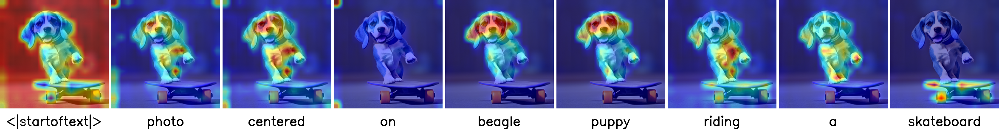

In [14]:
show_cross_attention_for_img(prompts=prompt1, latents=latents, auto_scale_heatmap=True)

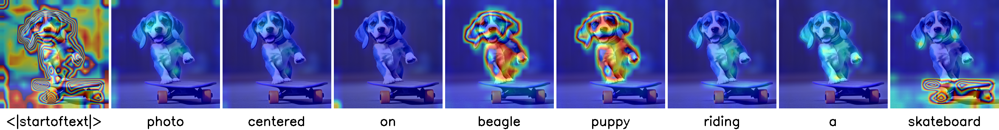

In [15]:
show_cross_attention_for_img(prompts=prompt1, latents=latents, auto_scale_heatmap=False, heatmap_scale=100.0)

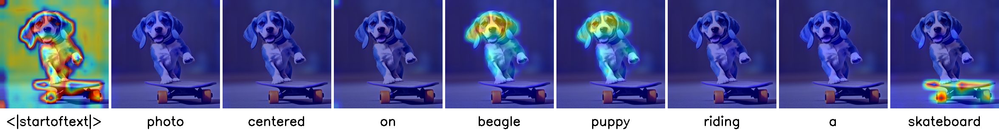

In [16]:
show_cross_attention_for_img(prompts=prompt1, latents=latents, auto_scale_heatmap=False, heatmap_scale=30.0)

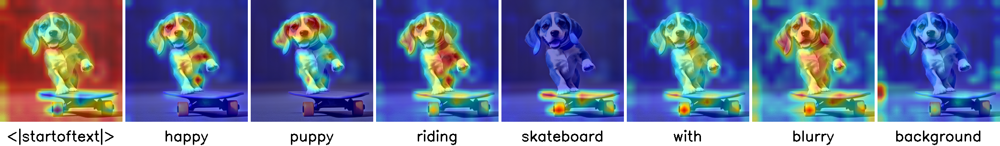

In [17]:
prompt2 = "happy puppy riding skateboard with blurry background"
show_cross_attention_for_img(prompts=prompt2, latents=latents, auto_scale_heatmap=True)

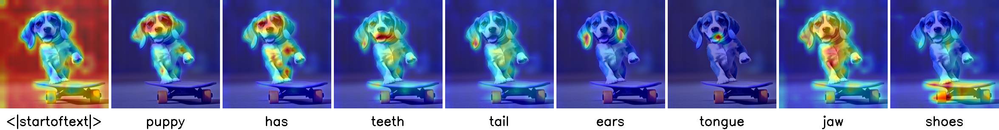

In [18]:
prompt3 = "puppy has teeth tail ears tongue jaw shoes"
show_cross_attention_for_img(prompts=prompt3, latents=latents)

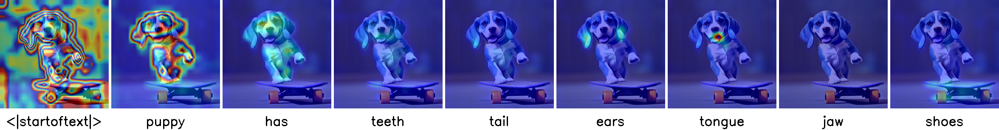

In [19]:
prompt3 = "puppy has teeth tail ears tongue jaw shoes"
show_cross_attention_for_img(prompts=prompt3, latents=latents, auto_scale_heatmap=False)

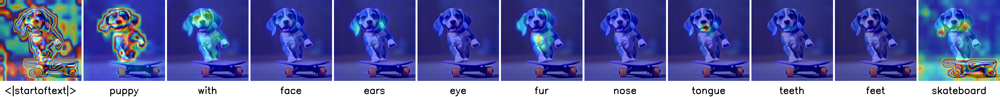

In [20]:
prompt4 = "puppy with face ears eye fur nose tongue teeth feet skateboard"
show_cross_attention_for_img(prompts=prompt4, latents=latents, auto_scale_heatmap=False, heatmap_scale=100.0)

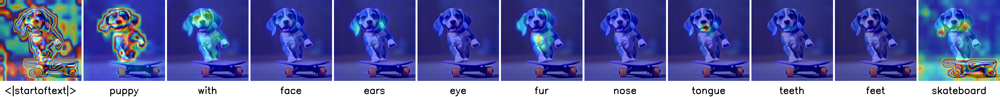

In [21]:
show_cross_attention_for_img(prompts=prompt4, latents=latents, auto_scale_heatmap=False, heatmap_scale=100.0)

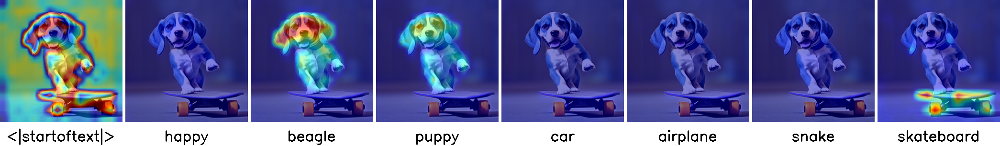

In [22]:
prompt5 = "happy beagle puppy car airplane snake skateboard"
show_cross_attention_for_img(prompts=prompt5, latents=latents, auto_scale_heatmap=False, heatmap_scale=30.0)

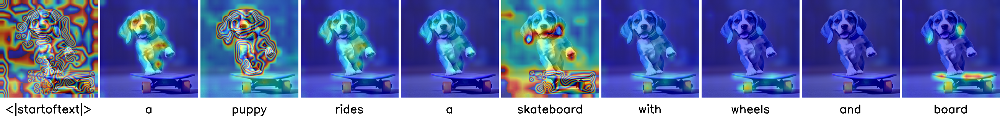

In [23]:
prompt6 = "a puppy rides a skateboard with wheels and board"
show_cross_attention_for_img(prompts=prompt6, latents=latents, auto_scale_heatmap=False, heatmap_scale=200.0) # needs to be a tuple

## Try variations of from_where:

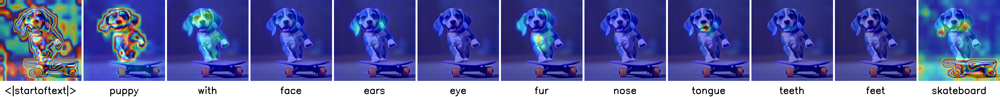

In [24]:
show_cross_attention_for_img(prompts=prompt4, latents=latents, from_where=("up", "down", "mid"), auto_scale_heatmap=False, heatmap_scale=100.0)

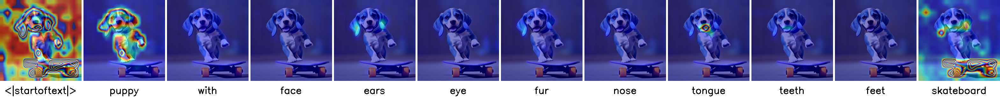

In [25]:
show_cross_attention_for_img(prompts=prompt4, latents=latents, from_where=("up", "up"), auto_scale_heatmap=False, heatmap_scale=100.0) # needs to be a tuple

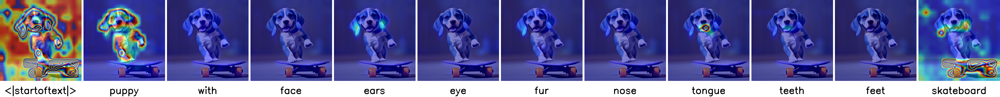

In [26]:
show_cross_attention_for_img(prompts=prompt4, latents=latents, from_where=("mid", "up"), auto_scale_heatmap=False, heatmap_scale=100.0) # needs to be a tuple

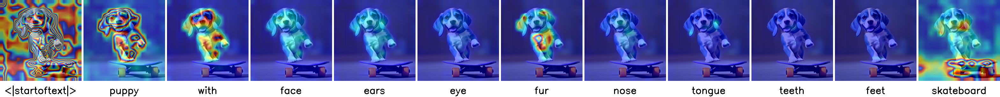

In [27]:
show_cross_attention_for_img(prompts=prompt4, latents=latents, from_where=("down", "down"), auto_scale_heatmap=False, heatmap_scale=100.0) # needs to be a tuple